# jaxsedfit: Single-SED Example (Full Chimera Dataset)

This notebook shows a minimal end-to-end fit of one SED using `jaxsedfit`, but it searches the full Chimera benchmark dataset instead of the small deterministic subset used by `01_example.ipynb`.

Workflow:
- load the full Chimera benchmark dataset
- build a `FitConfig`
- run a MAP fit
- compare recovered stellar mass to the Chimera truth value
- generate a `pcigale`-style component SED plot with the photometry overlaid

## Prerequisites

This notebook assumes:
- you are running it from the `jaxsedfit/notebooks` directory
- `jaxsedfit` dependencies are installed
- a valid DSPS SSP file is available

By default the notebook looks for `../jaxqsofit/tempdata.h5` as a sibling checkout.

`fit_method="optax"` and the MAP stage of `fit_method="optax+nuts"` use staged MAP/SVI initialization by default. Pass `staged_map=False` to `fit()` only when you specifically want the older single-stage optimizer path.


In [15]:
from pathlib import Path
import sys

import matplotlib.pyplot as plt
import numpy as np

project_root = Path.cwd().resolve().parent
src_root = project_root / "src"
if str(src_root) not in sys.path:
    sys.path.insert(0, str(src_root))

from jaxsedfit.benchmark import (
    build_chimera_fit_config,
    load_chimera_benchmark_dataset,
    select_chimera_subset,
)
from jaxsedfit.core import JAXSEDFit
from jaxsedfit.mplstyle import style_path

plt.style.use(style_path())

In [16]:
dsps_ssp_fn = project_root / "tempdata.h5"
assert dsps_ssp_fn.is_file(), f"DSPS SSP file not found: {dsps_ssp_fn}"

dataset = load_chimera_benchmark_dataset(project_root)
rows = dataset.rows

print(f"Loaded {len(rows)} Chimera benchmark rows")
if rows:
    print("Example benchmark object IDs:", [str(r["id"]) for r in rows[:5]])

# Use a fixed Chimera object_id from the full dataset so the example stays reproducible.
# If the requested object_id is not found, fall back to the first available row.
target_object_id = "083152.12+144938.0_922124_0.0001"
row = next((r for r in rows if str(r["id"]) == target_object_id), None)
if row is None:
    row = rows[0]
    print(
        "Requested target_object_id not found in the full Chimera dataset; "
        f"using the first available benchmark row with object_id={row['id']}"
    )

row["id"], row["chimera_QSO_weight"], row["redshift"], row["log_stellar_mass_truth"]

[benchmark] Loading Chimera photometry from /home/nicho/GRAHSP/jaxsedfit/data/chimeras-2023-10-11/chimeras-grahsp.fits
[benchmark] Loading Chimera truth table from /home/nicho/GRAHSP/jaxsedfit/data/chimeras-2023-10-11/chimeras-fullinfo.fits
[benchmark] Joined 18168 Chimera rows
Loaded 18168 Chimera benchmark rows
Example benchmark object IDs: ['011521.37+311730.6_386291_0.0003', '011529.24+321114.9_810483_0.001', '011601.41+322234.8_270428_0.3', '011601.41+322234.8_325694_0.1', '011601.41+322234.8_339240_0.03']


('083152.12+144938.0_922124_0.0001', 0.0001, 0.39800000190734863, 10.1193)

## Build the fit configuration

The Chimera helper seeds a few important priors from the row photometry and redshift so the fit starts on a more reasonable flux scale. This model now also enables host-galaxy energy balance by default: stellar light absorbed by host dust is re-emitted in the infrared with the Dale et al. (2014) host dust templates. AGN type is a fixed config choice, not an inferred parameter. The AGN line model now follows the `GRAHSP` branch logic more closely: type `1` includes broad lines, Sy2 narrow lines, Fe II, and optional Balmer continuum; types `2` and `3` suppress Fe II and Balmer continuum. For this tutorial run, reduce the optimizer and sampler settings so the example finishes more quickly. Increase them later if you want a stronger fit.


In [17]:
cfg = build_chimera_fit_config(row, dsps_ssp_fn=str(dsps_ssp_fn))
cfg.inference.map_steps = 400
cfg.inference.learning_rate = 5e-3
cfg.inference.num_warmup = 400
cfg.inference.num_samples = 400

print("Photometry-seeded prior centers:")
print("  log_stellar_mass:", cfg.prior_config.get("log_stellar_mass"))
print("  log_agn_amp:", cfg.prior_config.get("log_agn_amp"))
print("Host energy balance enabled:", cfg.galaxy.use_energy_balance)
print("Initial dust_alpha:", cfg.galaxy.dust_alpha)
print("Fixed AGN type:", cfg.agn.agn_type)
print("Set `cfg.agn.agn_type = 2` or `3` before fitting to compare Sy2/LINER branches.")

Photometry-seeded prior centers:
  log_stellar_mass: {'dist': 'student_t', 'loc': 10.0, 'scale': 2.0, 'df': 5.0}
  log_agn_amp: None
Host energy balance enabled: True
Initial dust_alpha: 2.0
Fixed AGN type: 1
Set `cfg.agn.agn_type = 2` or `3` before fitting to compare Sy2/LINER branches.


In [18]:
#fitter = JAXSEDFit(cfg)
# MAP/SVI initialization is staged by default.
#fit_result = fitter.fit(
    #fit_method="optax+nuts",
    #prior_config=cfg.prior_config,
    #dsps_ssp_fn=cfg.galaxy.dsps_ssp_fn,
    #optax_steps=600,
    #optax_lr=1e-2,
    #nuts_warmup=100,
    #nuts_samples=100,
    #nuts_chains=cfg.inference.num_chains,
    #plot_fig=False,
    #save_fig=False,
    #save_result=False,
    #progress_bar=True,
#)
fitter = JAXSEDFit(cfg)
fit_result = fitter.fit(
    fit_method="ns",
    prior_config=cfg.prior_config,
    dsps_ssp_fn=cfg.galaxy.dsps_ssp_fn,
    optax_steps=cfg.inference.map_steps,
    optax_lr=cfg.inference.learning_rate,
    nuts_warmup=cfg.inference.num_warmup,
    nuts_samples=cfg.inference.num_samples,
    nuts_chains=cfg.inference.num_chains,
    ns_live_points=700,
    ns_max_samples=8000,
    ns_dlogz=10,
    plot_fig=False,
    save_fig=False,
    save_result=False,
    progress_bar=True,
)


summary = fit_result["summary"]
logm_samples = np.asarray(fitter.samples["log_stellar_mass"], dtype=float).reshape(-1)
logm16, recovered_logm, logm84 = np.percentile(logm_samples, [16.0, 50.0, 84.0])
truth_logm = row["log_stellar_mass_truth"]

print("object_id:", row["id"])
print("chimera_QSO_weight:", row["chimera_QSO_weight"])
print("truth log stellar mass:", truth_logm)
print("recovered log stellar mass:", recovered_logm)
print("recovered 16-84% range:", (logm16, logm84))
print("residual:", recovered_logm - truth_logm)

INFO:jaxns:Number of Markov-chains set to: 700


Creating initial state with 700 live points.
Running uniform sampling down to efficiency threshold of 0.1.
Running until termination condition: TerminationCondition(ess=None, evidence_uncert=None, live_evidence_frac=None, dlogZ=Array(10., dtype=float64, weak_type=True), max_samples=Array(8050, dtype=int64), max_num_likelihood_evaluations=None, log_L_contour=None, efficiency_threshold=None, rtol=None, atol=None, peak_XL_frac=None)
-------
Num samples: 350
Num likelihood evals: 47869
Efficiency: 0.014517099068831788
log(L) contour: -7238.842408202533
log(Z) est.: 42.921294123071384 +- 0.43495752059376797
log(Z | remaining) est.: 7289.853788977402 +- 0.9389461769866767
ESS: 2.3925602601103098

-------
Num samples: 700
Num likelihood evals: 97102
Efficiency: 0.009547841505831003
log(L) contour: -264.3436849474972
log(Z) est.: 42.79593924094592 +- 0.34018323947568063
log(Z | remaining) est.: 315.7005822083731 +- 0.8929257683242365
ESS: 4.07538817505564

-------
Num samples: 1050
Num likelih

## Compare recovered stellar mass to Chimera truth

The recovered stellar mass below is shown with its posterior 16th-84th percentile uncertainty interval.

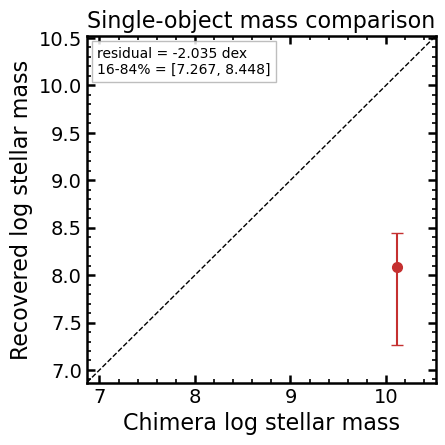

In [19]:
fig, ax = plt.subplots(figsize=(4.5, 4.5))
ax.errorbar(
    [truth_logm],
    [recovered_logm],
    yerr=[[recovered_logm - logm16], [logm84 - recovered_logm]],
    fmt="o",
    color="#c53030",
    capsize=4,
    ms=7,
)
lims = [min(truth_logm, logm16) - 0.4, max(truth_logm, logm84) + 0.4]
ax.plot(lims, lims, color="black", ls="--", lw=1.0)
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_xlabel("Chimera log stellar mass")
ax.set_ylabel("Recovered log stellar mass")
ax.set_title("Single-object mass comparison")
ax.text(
    0.03,
    0.97,
    f"residual = {recovered_logm - truth_logm:+.3f} dex\n16-84% = [{logm16:.3f}, {logm84:.3f}]",
    transform=ax.transAxes,
    va="top",
    ha="left",
    fontsize=10,
    bbox={"facecolor": "white", "alpha": 0.85, "edgecolor": "0.7"},
)
plt.show()

## Generate a component SED plot

`fit()` defers predictive model evaluation until you explicitly request it. Calling `plot_sed()` will trigger the predictive path and draw the total model, the stellar host, the host dust IR re-emission, and the AGN sub-components together with the observed photometry. Zero-only AGN branches are omitted from the plot automatically, so Sy2/LINER fits stay uncluttered.

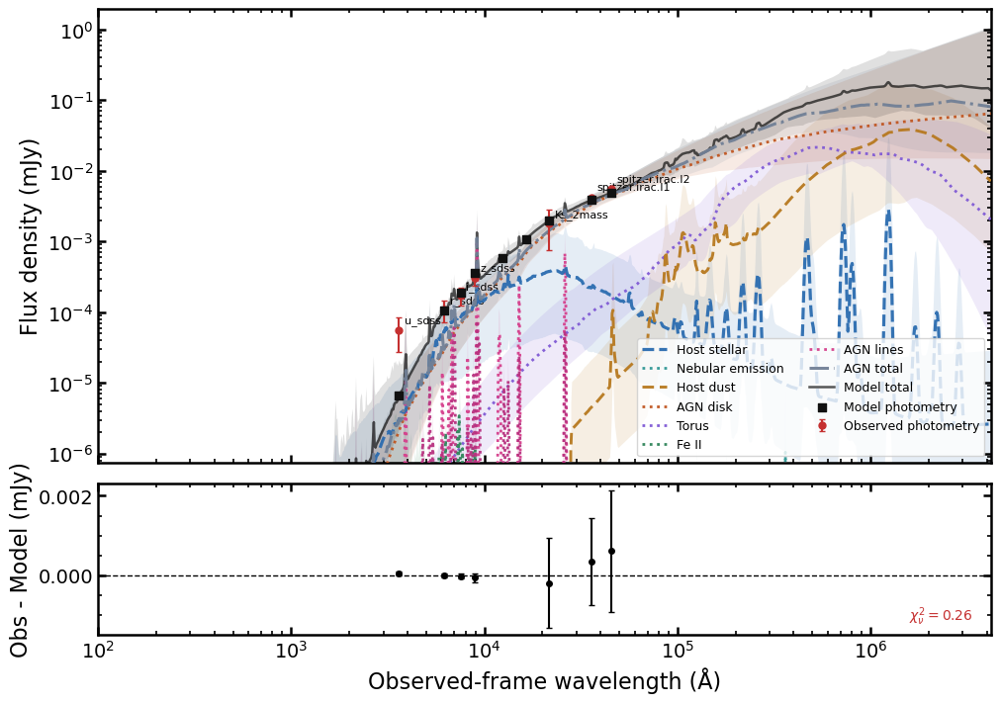

filter, eff_wave_A, obs_mJy, model_mJy, host_stellar_mJy, host_dust_mJy, agn_mJy
('u_sdss', np.float64(3614.373573958611), 5.607155981124379e-05, np.float64(4.646708269926112e-05), np.float64(3.5771806397510575e-05), np.float64(0.0), np.float64(1.069527630175055e-05))
('r_sdss', np.float64(6205.832237243061), 0.00010815603309310973, np.float64(0.00011248546633976997), np.float64(9.014316574211978e-05), np.float64(0.0), np.float64(2.2342300597650223e-05))
('i_sdss', np.float64(7525.622462977008), 0.0001715922262519598, np.float64(0.0001519731103625533), np.float64(0.00010026198233803503), np.float64(0.0), np.float64(5.1711128024518246e-05))
('z_sdss', np.float64(8947.384740828762), 0.00030921288998797536, np.float64(0.00024051097047218096), np.float64(0.00011983465465922236), np.float64(0.0), np.float64(0.00012067631581295857))
('J_2mass', np.float64(12407.991602068245), nan, np.float64(0.0002989478729390862), np.float64(0.00014401175324760954), np.float64(0.0), np.float64(0.00015493611

[('u_sdss',
  np.float64(3614.373573958611),
  5.607155981124379e-05,
  np.float64(4.646708269926112e-05),
  np.float64(3.5771806397510575e-05),
  np.float64(0.0),
  np.float64(1.069527630175055e-05)),
 ('r_sdss',
  np.float64(6205.832237243061),
  0.00010815603309310973,
  np.float64(0.00011248546633976997),
  np.float64(9.014316574211978e-05),
  np.float64(0.0),
  np.float64(2.2342300597650223e-05)),
 ('i_sdss',
  np.float64(7525.622462977008),
  0.0001715922262519598,
  np.float64(0.0001519731103625533),
  np.float64(0.00010026198233803503),
  np.float64(0.0),
  np.float64(5.1711128024518246e-05))]

In [20]:
pred = fitter.predict()
fig = fitter.plot_sed(show=True)

model_flux = np.asarray(pred["pred_fluxes"][0], dtype=float)
host_flux = np.asarray(pred["host_fluxes"][0], dtype=float)
dust_flux = np.asarray(pred["dust_fluxes"][0], dtype=float)
agn_flux = np.asarray(pred["agn_fluxes"][0], dtype=float)
phot_wave = np.asarray([flt.effective_wavelength for flt in fitter.context.filters], dtype=float)
log_dust_luminosity = float(np.median(np.asarray(pred['log_dust_luminosity_fit'], dtype=float)))
dust_luminosity = 10 ** log_dust_luminosity

component_table = [
    (name, wave, obs, model, host, dust, agn)
    for name, wave, obs, model, host, dust, agn in zip(
        cfg.photometry.filter_names,
        phot_wave,
        cfg.photometry.fluxes,
        model_flux,
        host_flux,
        dust_flux,
        agn_flux,
    )
]
print("filter, eff_wave_A, obs_mJy, model_mJy, host_stellar_mJy, host_dust_mJy, agn_mJy")
for row_vals in component_table:
    print(row_vals)

#print("dust luminosity [W]:", dust_luminosity)
print("stellar / total model:", float(np.sum(host_flux) / np.maximum(np.sum(model_flux), 1e-30)))
print("dust / total model:", float(np.sum(dust_flux) / np.maximum(np.sum(model_flux), 1e-30)))
print("agn / total model:", float(np.sum(agn_flux) / np.maximum(np.sum(model_flux), 1e-30)))

component_table[:3]

In [21]:
import corner
import numpy as np

samples = fitter.samples

param_names = []
cols = []

for name, value in samples.items():
    arr = np.asarray(value, dtype=float)
    if arr.ndim == 1:
        vec = arr
    elif arr.ndim == 2 and arr.shape[1] == 1:
        vec = arr[:, 0]
    else:
        continue

    if not np.all(np.isfinite(vec)):
        continue
    if np.nanmax(vec) - np.nanmin(vec) <= 1e-10:
        continue

    param_names.append(name)
    cols.append(vec)

X = np.column_stack(cols)

fig = corner.corner(
    X,
    labels=param_names,
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_fmt=".3f",
    bins=30,
)

dropped = []
for name, value in samples.items():
    arr = np.asarray(value, dtype=float)
    if arr.ndim == 1:
        vec = arr
    elif arr.ndim == 2 and arr.shape[1] == 1:
        vec = arr[:, 0]
    else:
        continue
    if not np.all(np.isfinite(vec)) or (np.nanmax(vec) - np.nanmin(vec) <= 1e-10):
        dropped.append(name)

print(dropped)

['agn_variability_nev', 'host_capture_slope_fit', 'log_host_capture_scale_arcsec_fit', 'log_spectrum_scale_fit', 'nebular_corr_fit', 'nebular_f_dust_fit', 'nebular_f_esc_fit', 'nebular_lines_width_fit', 'nebular_logU_fit', 'nebular_ne_fit', 'redshift_fit', 'spectroscopy_loglike', 'spectrum_scale_fit']


## Next steps

- compare the printed host and AGN model photometry against the observed points band by band
- if the model is still too host-dominated, tighten `cfg.prior_config["log_stellar_mass"]` and/or broaden `cfg.prior_config["log_agn_amp"]`
- increase `cfg.inference.map_steps`, `num_warmup`, and `num_samples` for a stronger posterior fit
- use `fitter.save(...)` to write a posterior bundle
- swap in your own photometry by constructing a custom `FitConfig`